In [ ]:
from PIL import Image
import os

# 이미지 자르기
for i in range(77, 121):  # (2)부터 (34)까지
    image_path = f'스크린샷({i}).png'


    # 이미지 확인
    if os.path.exists(image_path):
        with Image.open(image_path) as img:
            width, height = img.size

            # 비율 계산
            new_width = width * 0.7  # 가로 길이의 15%를 양쪽에서 제거하므로, 70%만 남김
            new_height = height * 0.66  # 세로 길이의 17%를 양쪽에서 제거하므로, 66%만 남김

            # 시작점 계산
            left = (width - new_width) / 2
            top = (height - new_height) / 2
            right = (width + new_width) / 2
            bottom = (height + new_height) / 2

            # 이미지 잘라내기
            img_cropped = img.crop((left, top, right, bottom))

            # 잘라낸 이미지 저장
            img_cropped.save(f'cropped_스크린샷({i}).png')
    else:
        print(f'{image_path} does not exist.')

In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil
import pandas as pd

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'deeplabv3-mobilenetv3/tflite/cityscapes/2:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-models-data%2F850%2F997%2Fbundle%2Farchive.tar.gz%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240414%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240414T073946Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D354a0d68761d1df883ac071230b1e7e58f16f127aced42205fdabe4421c76637d2036a9f5544f2c07aca7a42d243da976a12a7b95f3b292324195ca7847ddbf1a07ee0b6bdef24deaa7d649a5cff4db05659b33378ab493a76e63ac8d6d0f9a79747fdebceac2674c45aea28b6527185745eefea72c59a79cbb7bff8dae00d3333fcf0ef806a1b3f85037189348fe85e6791935f6598971dbd50e50876c505d23e957895647781546bf5c658590348be16d9d95331625fa7d2db1be72eb7d7e4491207fd068cf49e802e49d1deaa64149dc7843266816233a3b1145b0d58e752f3348c64f6b997aeb4f03314bfb4e019328635f4ef69875f6f6eb70bf8cf7417,deeplabv3-xception65/tflite/cityscapes/2:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-models-data%2F2417%2F3261%2Fbundle%2Farchive.tar.gz%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240414%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240414T073946Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3Dba6fb760b0551374750eb012ee954fa09834f3f5eeedd84eff498d475c9f7c86ae0e9f8a84ca5d25a8ff156d6dc269dbf4d880a5e14ef8a1b1f88b3f65e892735e4063e35e12452b7a8c906d18a0c98e0295966f2ef1272eb8d3f9eeacd60bdc8e73fd7cb27b0cfca3465cb80389d431c2bc37399c272ed98cf7a45c86cba1ea974fd972c761a2979384be528060049390aecd922c9dc2ac609958026b6bda1c348edc5dbfe97b8289ce0ed607113b39a246c000e7cd12373d4061982f64e794f532c51e17525b754ab24083f46f6c38fd7e48f202bbd09a3504f499a77b706a904574be278bcc9f5b28c964bd07ab36c45270020707a978597afb47c7dd84e0'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


import os
import tempfile
import numpy as np
import tensorflow as tf
print(tf.__version__)

# Load the model.
tflite_path = '/kaggle/input/deeplabv3-mobilenetv3/tflite/cityscapes/2/2.tflite'
interpreter = tf.lite.Interpreter(model_path=tflite_path)

# Set model input.
input_details = interpreter.get_input_details()
interpreter.allocate_tensors()

# Get image size - converting from BHWC to WH # ([1,1025,2049,19]: Shape of ResizeBilinear_2 op)
input_size = input_details[0]['shape'][2], input_details[0]['shape'][1]
print(input_size)


[==================================================] 997466 bytes downloaded
Downloaded and uncompressed: deeplabv3-mobilenetv3/tflite/cityscapes/2
[==================================================] 27884009 bytes downloaded
Downloaded and uncompressed: deeplabv3-xception65/tflite/cityscapes/2
Data source import complete.
2.15.0
(2049, 1025)


<ipython-input-3-561100230df1>:25: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 12.46%


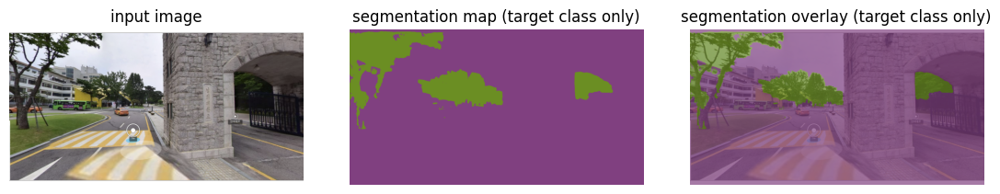

In [ ]:
from PIL import Image, ImageOps

# 이미지 경로와 입력 크기 설정
image_path = "/content/cropped_스크린샷(77).png"
input_size = (2049, 1025)  # 예시로 사용한 크기, 필요에 따라 조정

# 이미지 로드
image = Image.open(image_path)
old_size = image.size  # old_size는 (width, height) 포맷

# 비율 계산
desired_ratio = input_size[0] / input_size[1]
old_ratio = old_size[0] / old_size[1]

# 새 크기 계산
if old_ratio < desired_ratio:  # '<': 크롭, '>': 패딩
    new_size = (old_size[0], int(old_size[0] / desired_ratio))
else:
    new_size = (int(old_size[1] * desired_ratio), old_size[1])

# 이미지 크롭 또는 패딩
delta_w = new_size[0] - old_size[0]
delta_h = new_size[1] - old_size[1]
padding = (abs(delta_w)//2, abs(delta_h)//2, abs(delta_w)//2, abs(delta_h)//2)
new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))
cropped_image = ImageOps.expand(new_image, padding)

# 결과 출력
new_image.show()

# Resize the cropped image to the desired model size
resized_image = cropped_image.convert('RGB').resize(input_size, Image.BILINEAR)

# Convert to a NumPy array, add a batch dimension, and normalize the image.
image_for_prediction = np.asarray(resized_image).astype(np.float32)
image_for_prediction = np.expand_dims(image_for_prediction, 0)
image_for_prediction = image_for_prediction / 127.5 - 1

# Load the model.
interpreter = tf.lite.Interpreter(model_path=tflite_path)

# Invoke the interpreter to run inference.
interpreter.allocate_tensors()
interpreter.set_tensor(input_details[0]['index'], image_for_prediction)
interpreter.invoke()

# Retrieve the raw output map.
raw_prediction = interpreter.tensor(
    interpreter.get_output_details()[0]['index'])()

# Post-processing: convert raw output to segmentation output
## Method 1: argmax before resize - this is used in some frozen graph
# seg_map = np.squeeze(np.argmax(raw_prediction, axis=3)).astype(np.int8)
# seg_map = np.asarray(Image.fromarray(seg_map).resize(image.size, resample=Image.NEAREST))
## Method 2: resize then argmax - this is used in some other frozen graph and produce smoother output
width, height = cropped_image.size
seg_map = tf.argmax(tf.image.resize(raw_prediction, (height, width)), axis=3)
seg_map = tf.squeeze(seg_map).numpy().astype(np.int8)

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec


from matplotlib import gridspec
from matplotlib import pyplot as plt

def create_cityscapes_label_colormap():
  """Creates a label colormap used in CITYSCAPES segmentation benchmark.
  Returns:
    A colormap for visualizing segmentation results.
  """
  colormap = np.zeros((256, 3), dtype=np.uint8)
  colormap[0] = [128, 64, 128]
  colormap[1] = [244, 35, 232]
  colormap[2] = [70, 70, 70]
  colormap[3] = [102, 102, 156]
  colormap[4] = [190, 153, 153]
  colormap[5] = [153, 153, 153]
  colormap[6] = [250, 170, 30]
  colormap[7] = [220, 220, 0]
  colormap[8] = [107, 142, 35]
  colormap[9] = [152, 251, 152]
  colormap[10] = [70, 130, 180]
  colormap[11] = [220, 20, 60]
  colormap[12] = [255, 0, 0]
  colormap[13] = [0, 0, 142]
  colormap[14] = [0, 0, 70]
  colormap[15] = [0, 60, 100]
  colormap[16] = [0, 80, 100]
  colormap[17] = [0, 0, 230]
  colormap[18] = [119, 11, 32]
  return colormap


def label_to_color_image(label):
  """Adds color defined by the dataset colormap to the label.

  Args:
    label: A 2D array with integer type, storing the segmentation label.

  Returns:
    result: A 2D array with floating type. The element of the array
      is the color indexed by the corresponding element in the input label
      to the PASCAL color map.

  Raises:
    ValueError: If label is not of rank 2 or its value is larger than color
      map maximum entry.
  """
  if label.ndim != 2:
    raise ValueError('Expect 2-D input label')

  colormap = create_cityscapes_label_colormap()

  if np.max(label) >= len(colormap):
    raise ValueError('label value too large.')

  return colormap[label]



# 여기에 필요한 FULL_COLOR_MAP과 LABEL_NAMES를 정의하거나 불러와야 함

def vis_segmentation(image, seg_map, target_class=8):
    """Visualizes input image, segmentation map of the target class, and overlay view."""
    plt.figure(figsize=(15, 5))
    grid_spec = gridspec.GridSpec(1, 4, width_ratios=[6, 6, 6, 1])

    # 원본 이미지 표시
    plt.subplot(grid_spec[0])
    plt.imshow(image)
    plt.axis('off')
    plt.title('input image')

    # segmentation map에서 target_class만 추출
    target_seg_map = np.zeros_like(seg_map)
    target_seg_map[seg_map == target_class] = target_class

    # target_class에 해당하는 색상만 적용하여 색칠
    seg_image = label_to_color_image(target_seg_map).astype(np.uint8)

    # Segmentation map 시각화
    plt.subplot(grid_spec[1])
    plt.imshow(seg_image)
    plt.axis('off')
    plt.title('segmentation map (target class only)')

    # Overlay 표시
    plt.subplot(grid_spec[2])
    plt.imshow(image)
    plt.imshow(seg_image, alpha=0.7)
    plt.axis('off')
    plt.title('segmentation overlay (target class only)')

    # 클래스 8의 비율 계산 및 출력
    class_8_ratio = np.sum(seg_map == target_class) / seg_map.size
    print(f"Class 8's area ratio: {class_8_ratio:.2%}")

    plt.show()

# 이미지와 세그멘테이션 맵(seg_map)을 가지고 있다고 가정
vis_segmentation(cropped_image, seg_map, target_class=8)

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 12.46%


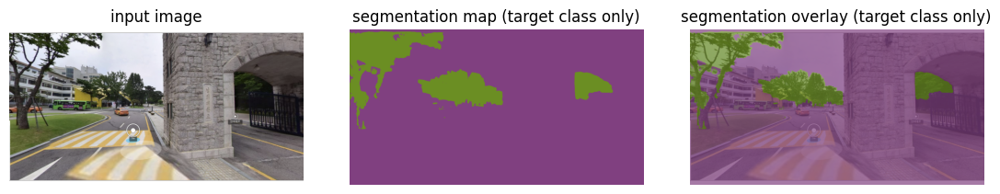

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 8.58%


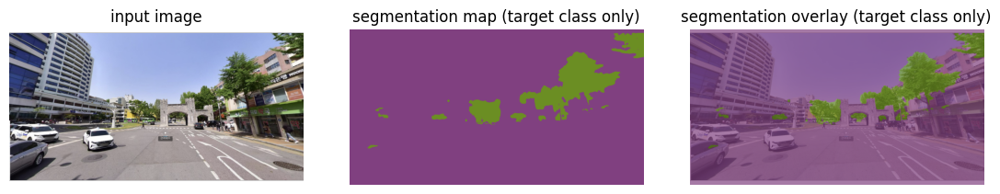

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 28.55%


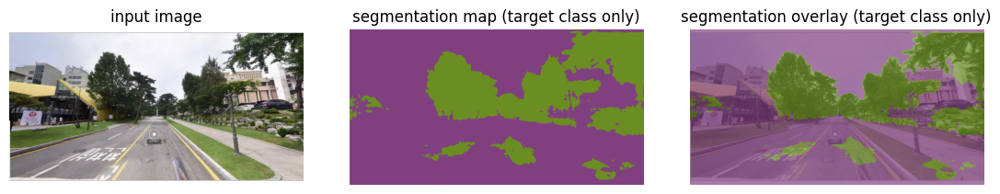

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 34.11%


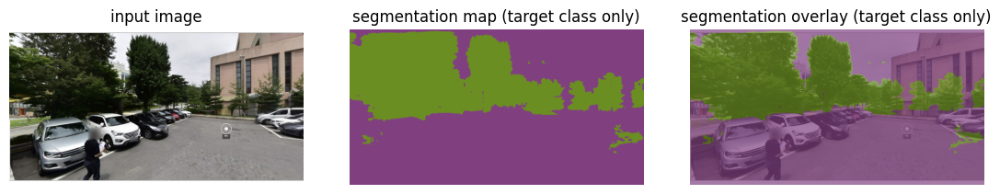

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 46.10%


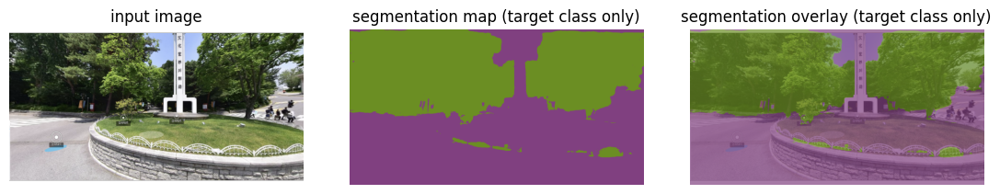

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 34.49%


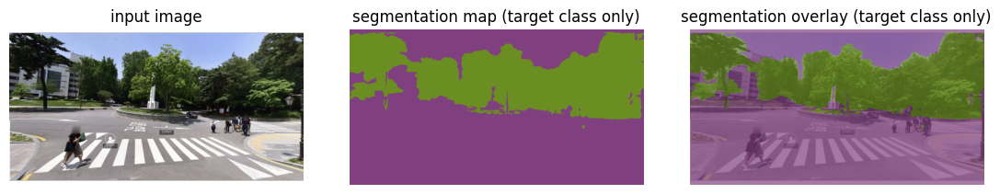

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 59.14%


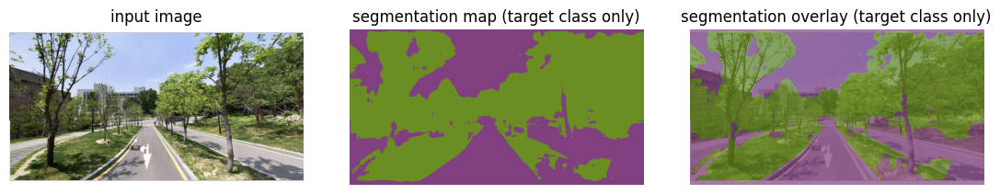

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 72.80%


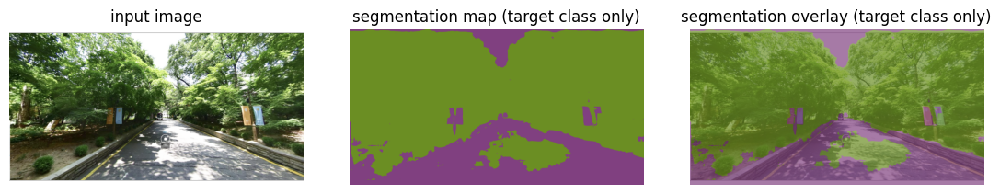

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 49.06%


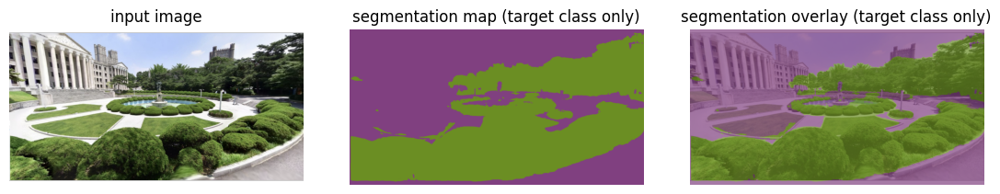

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 42.23%


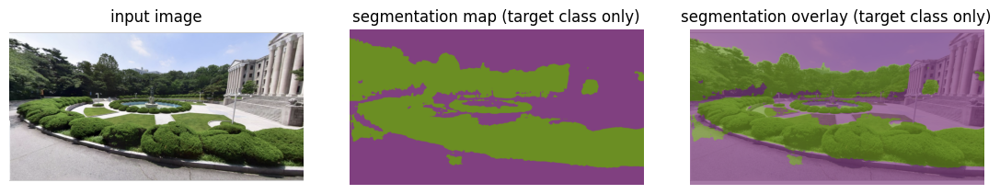

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 42.69%


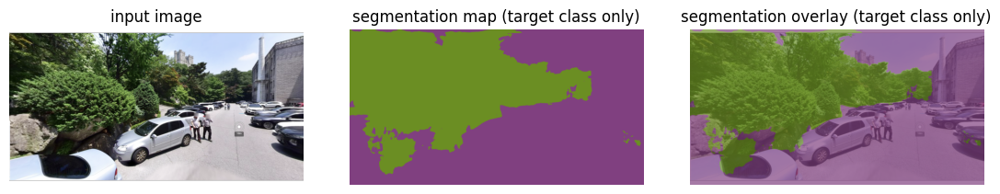

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 79.15%


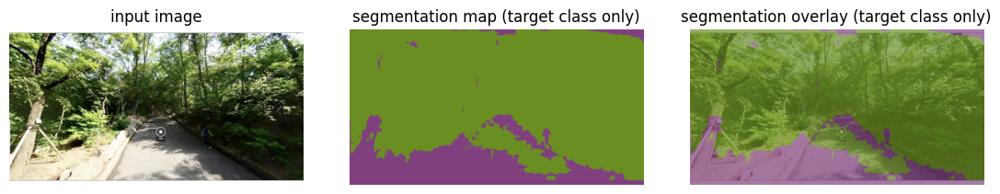

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 82.65%


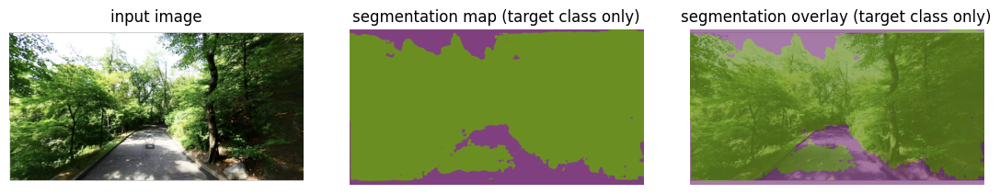

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 71.40%


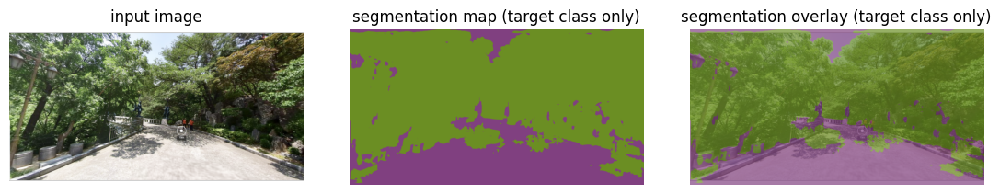

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 40.91%


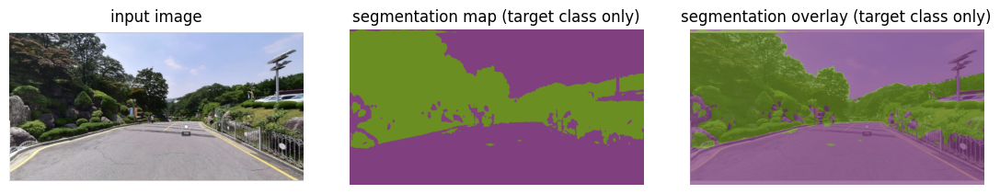

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 24.08%


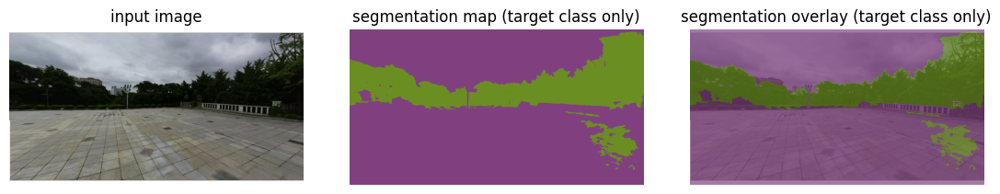

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 55.90%


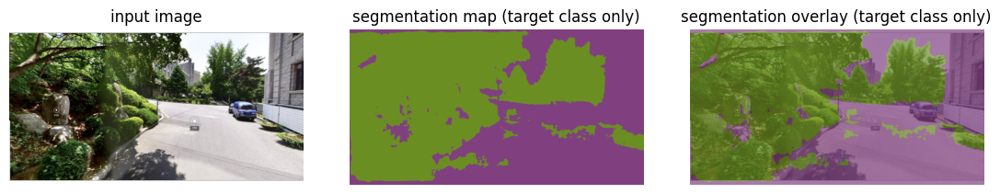

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 64.86%


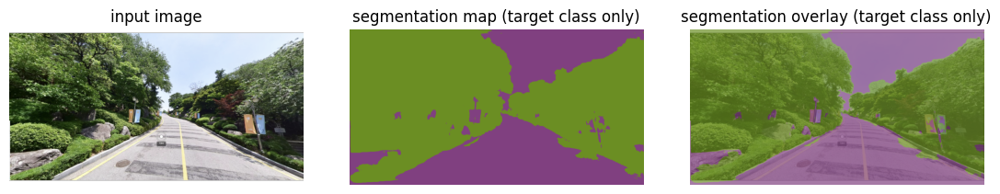

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 67.96%


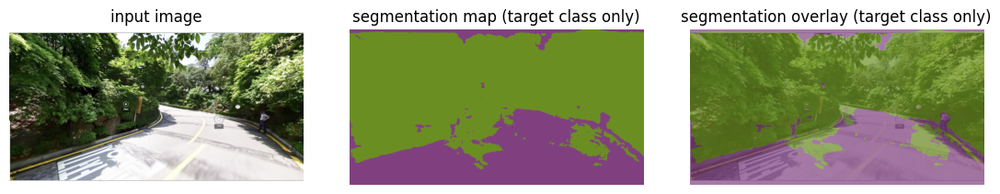

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 17.38%


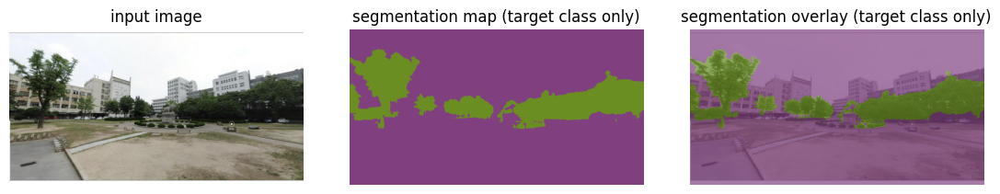

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 57.13%


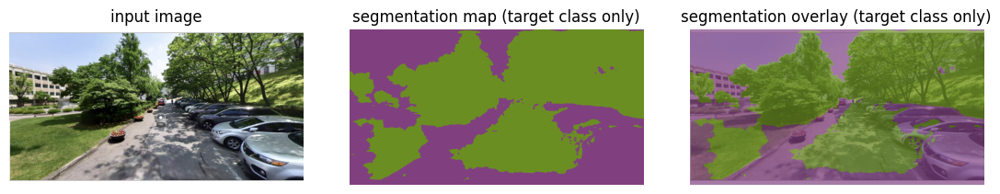

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 44.45%


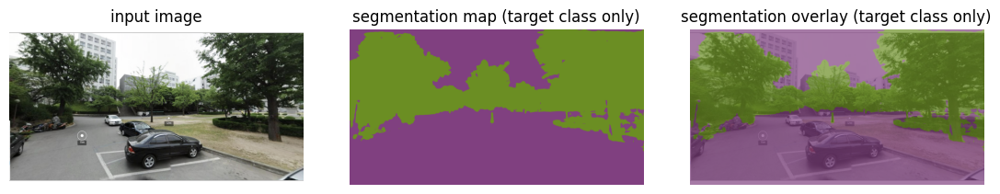

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 32.56%


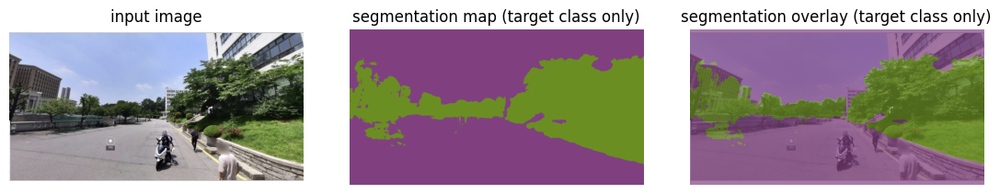

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 50.19%


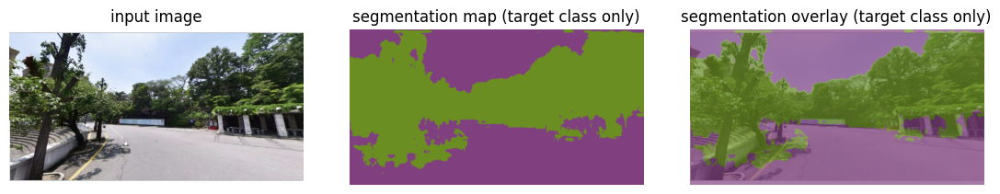

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 55.77%


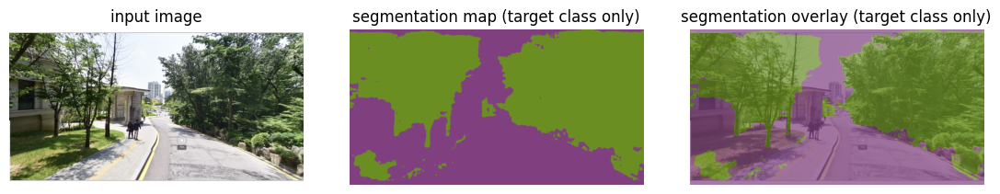

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 37.13%


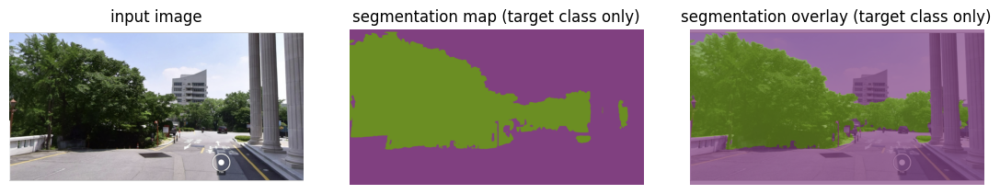

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 64.50%


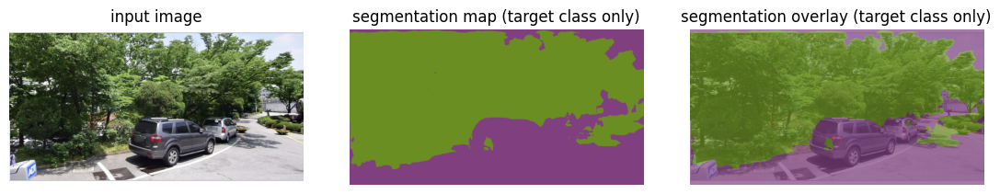

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 64.76%


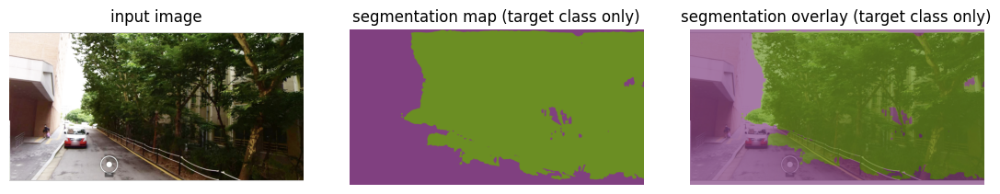

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 50.99%


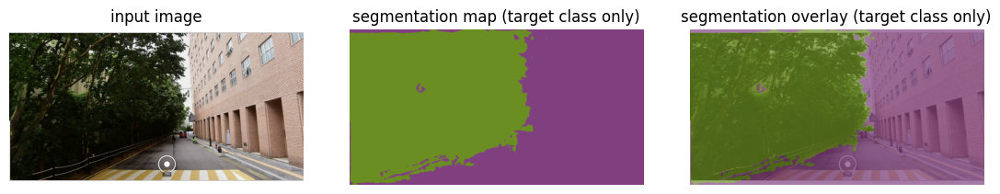

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 55.33%


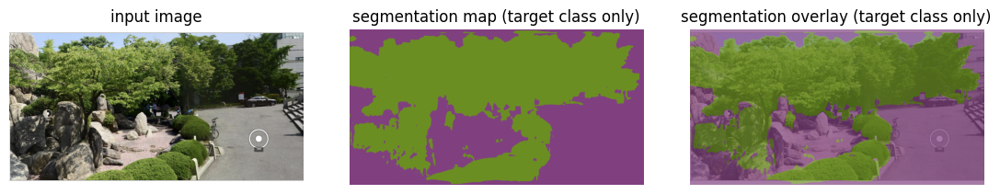

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 81.78%


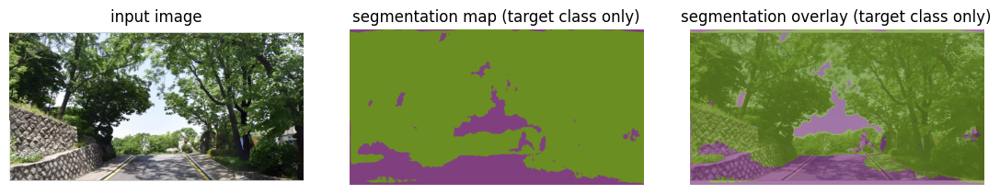

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 88.23%


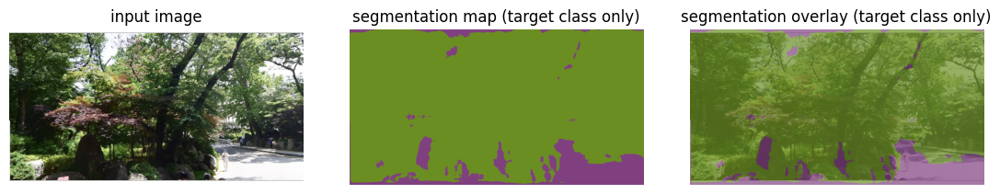

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 77.06%


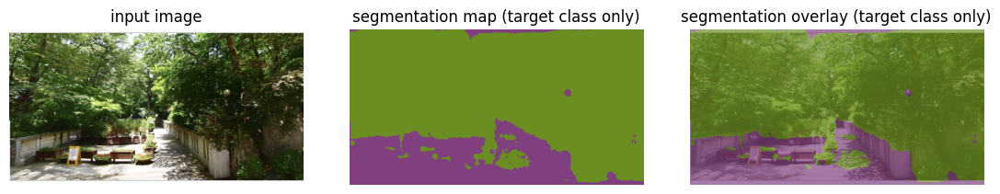

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 78.95%


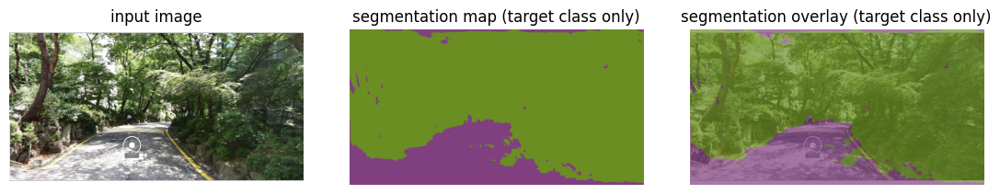

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 79.48%


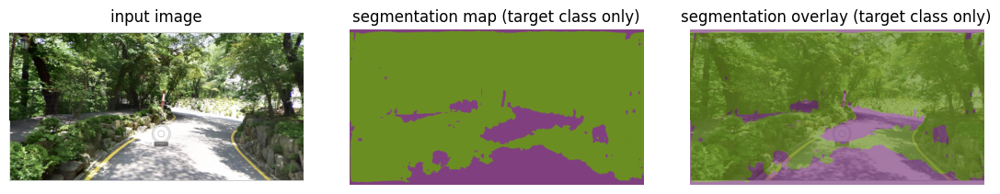

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 52.53%


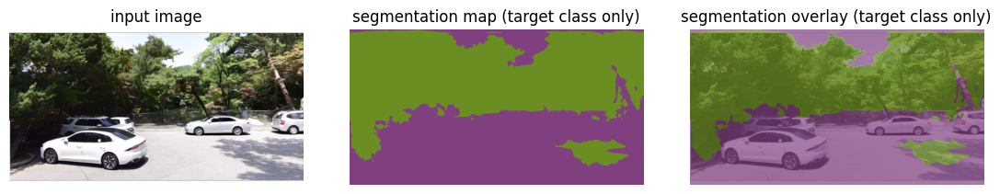

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 79.26%


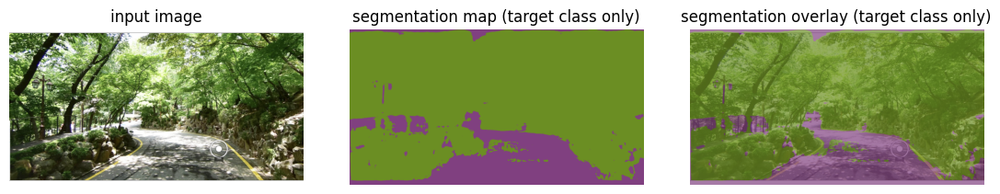

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 71.92%


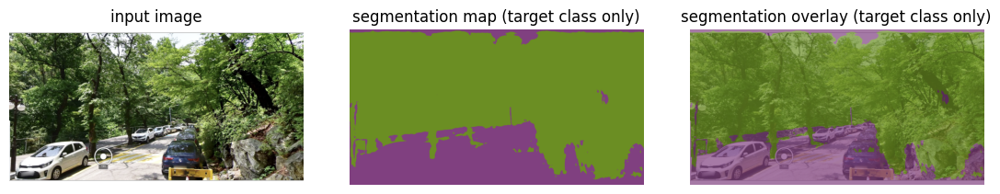

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 82.12%


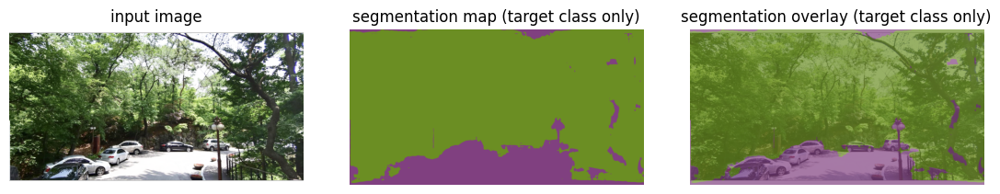

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 83.63%


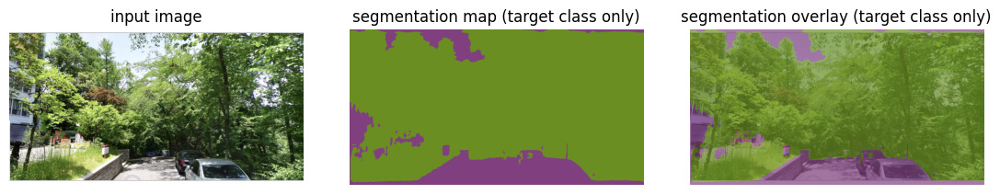

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 86.02%


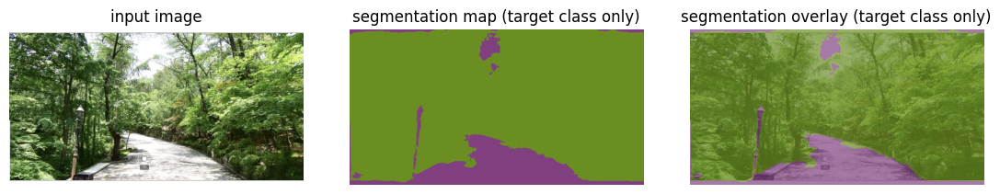

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 86.29%


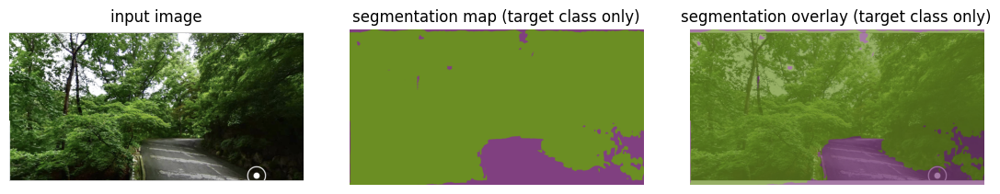

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 85.41%


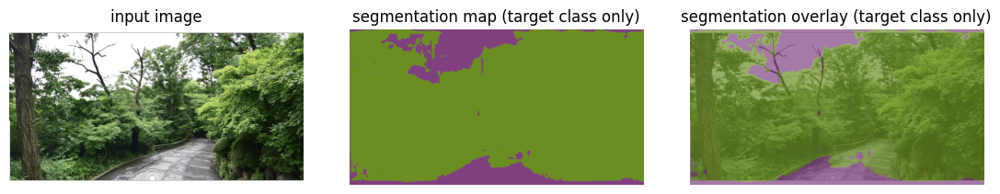

<ipython-input-4-09cf2dada859>:37: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))


Class 8's area ratio: 75.72%


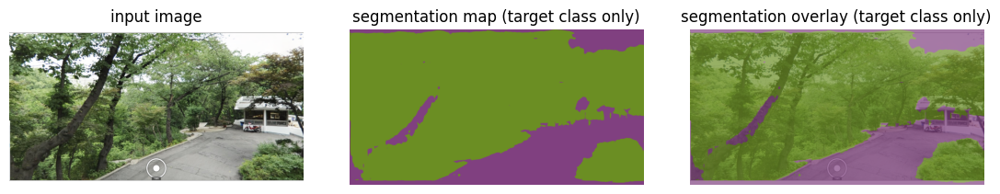

    Image_Number  Class_8_Ratio
0             77       0.124562
1             78       0.124562
2             79       0.085816
3             80       0.285528
4             81       0.341101
5             82       0.461038
6             83       0.344863
7             84       0.591445
8             85       0.728040
9             86       0.490592
10            87       0.422312
11            88       0.426926
12            89       0.791520
13            90       0.826525
14            91       0.713962
15            92       0.409082
16            93       0.240814
17            94       0.559035
18            95       0.648617
19            96       0.679570
20            97       0.173787
21            98       0.571305
22            99       0.444506
23           100       0.325619
24           101       0.501944
25           102       0.557661
26           103       0.371347
27           104       0.645046
28           105       0.647621
29           106       0.509866
30      

In [ ]:
from PIL import Image, ImageOps


class_8_ratios = []



# 이미지 경로와 입력 크기 설정
# 이미지 파일 처리
for image_number in range(77, 121):  # 스크린샷(2).png부터 스크린샷(34).png까지
    image_path = f'/content/cropped_스크린샷({image_number}).png'  # 이미지 경로 설정
    image = Image.open(image_path).convert('RGB')


    class_8_ratio = np.sum(seg_map == 8) / seg_map.size
    class_8_ratios.append(class_8_ratio)


    # 이미지 로드
    image = Image.open(image_path)
    old_size = image.size  # old_size는 (width, height) 포맷

    # 비율 계산
    desired_ratio = input_size[0] / input_size[1]
    old_ratio = old_size[0] / old_size[1]

    # 새 크기 계산
    if old_ratio < desired_ratio:  # '<': 크롭, '>': 패딩
        new_size = (old_size[0], int(old_size[0] / desired_ratio))
    else:
        new_size = (int(old_size[1] * desired_ratio), old_size[1])

    # 이미지 크롭 또는 패딩
    delta_w = new_size[0] - old_size[0]
    delta_h = new_size[1] - old_size[1]
    padding = (abs(delta_w)//2, abs(delta_h)//2, abs(delta_w)//2, abs(delta_h)//2)
    new_image = ImageOps.fit(image, new_size, Image.ANTIALIAS, 0, (0.5, 0.5))
    cropped_image = ImageOps.expand(new_image, padding)

    # 결과 출력
    new_image.show()

    # Resize the cropped image to the desired model size
    resized_image = cropped_image.convert('RGB').resize(input_size, Image.BILINEAR)

    # Convert to a NumPy array, add a batch dimension, and normalize the image.
    image_for_prediction = np.asarray(resized_image).astype(np.float32)
    image_for_prediction = np.expand_dims(image_for_prediction, 0)
    image_for_prediction = image_for_prediction / 127.5 - 1

    # Load the model.
    interpreter = tf.lite.Interpreter(model_path=tflite_path)

    # Invoke the interpreter to run inference.
    interpreter.allocate_tensors()
    interpreter.set_tensor(input_details[0]['index'], image_for_prediction)
    interpreter.invoke()

    # Retrieve the raw output map.
    raw_prediction = interpreter.tensor(
        interpreter.get_output_details()[0]['index'])()

    # Post-processing: convert raw output to segmentation output
    ## Method 1: argmax before resize - this is used in some frozen graph
    # seg_map = np.squeeze(np.argmax(raw_prediction, axis=3)).astype(np.int8)
    # seg_map = np.asarray(Image.fromarray(seg_map).resize(image.size, resample=Image.NEAREST))
    ## Method 2: resize then argmax - this is used in some other frozen graph and produce smoother output
    width, height = cropped_image.size
    seg_map = tf.argmax(tf.image.resize(raw_prediction, (height, width)), axis=3)
    seg_map = tf.squeeze(seg_map).numpy().astype(np.int8)

    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec


    from matplotlib import gridspec
    from matplotlib import pyplot as plt

    def create_cityscapes_label_colormap():
      """Creates a label colormap used in CITYSCAPES segmentation benchmark.
      Returns:
        A colormap for visualizing segmentation results.
      """
      colormap = np.zeros((256, 3), dtype=np.uint8)
      colormap[0] = [128, 64, 128]
      colormap[1] = [244, 35, 232]
      colormap[2] = [70, 70, 70]
      colormap[3] = [102, 102, 156]
      colormap[4] = [190, 153, 153]
      colormap[5] = [153, 153, 153]
      colormap[6] = [250, 170, 30]
      colormap[7] = [220, 220, 0]
      colormap[8] = [107, 142, 35]
      colormap[9] = [152, 251, 152]
      colormap[10] = [70, 130, 180]
      colormap[11] = [220, 20, 60]
      colormap[12] = [255, 0, 0]
      colormap[13] = [0, 0, 142]
      colormap[14] = [0, 0, 70]
      colormap[15] = [0, 60, 100]
      colormap[16] = [0, 80, 100]
      colormap[17] = [0, 0, 230]
      colormap[18] = [119, 11, 32]
      return colormap


    def label_to_color_image(label):
      """Adds color defined by the dataset colormap to the label.

      Args:
        label: A 2D array with integer type, storing the segmentation label.

      Returns:
        result: A 2D array with floating type. The element of the array
          is the color indexed by the corresponding element in the input label
          to the PASCAL color map.

      Raises:
        ValueError: If label is not of rank 2 or its value is larger than color
          map maximum entry.
      """
      if label.ndim != 2:
        raise ValueError('Expect 2-D input label')

      colormap = create_cityscapes_label_colormap()

      if np.max(label) >= len(colormap):
        raise ValueError('label value too large.')

      return colormap[label]



    # 여기에 필요한 FULL_COLOR_MAP과 LABEL_NAMES를 정의하거나 불러와야 함

    def vis_segmentation(image, seg_map, target_class=8):
        """Visualizes input image, segmentation map of the target class, and overlay view."""
        plt.figure(figsize=(15, 5))
        grid_spec = gridspec.GridSpec(1, 4, width_ratios=[6, 6, 6, 1])

        # 원본 이미지 표시
        plt.subplot(grid_spec[0])
        plt.imshow(image)
        plt.axis('off')
        plt.title('input image')

        # segmentation map에서 target_class만 추출
        target_seg_map = np.zeros_like(seg_map)
        target_seg_map[seg_map == target_class] = target_class

        # target_class에 해당하는 색상만 적용하여 색칠
        seg_image = label_to_color_image(target_seg_map).astype(np.uint8)

        # Segmentation map 시각화
        plt.subplot(grid_spec[1])
        plt.imshow(seg_image)
        plt.axis('off')
        plt.title('segmentation map (target class only)')

        # Overlay 표시
        plt.subplot(grid_spec[2])
        plt.imshow(image)
        plt.imshow(seg_image, alpha=0.7)
        plt.axis('off')
        plt.title('segmentation overlay (target class only)')

        # 클래스 8의 비율 계산 및 출력
        class_8_ratio = np.sum(seg_map == target_class) / seg_map.size
        print(f"Class 8's area ratio: {class_8_ratio:.2%}")

        plt.show()

        class_8_ratios = []

    # 이미지 파일 처리 반복문 (이전 코드에 이어짐)
    for image_number in range(77, 121):  # 스크린샷(2).png부터 스크린샷(34).png까지
        image_path = f'/content/cropped_스크린샷({image_number}).png'
        # 이미지 처리, 모델 실행 및 세그멘테이션 맵 추출 코드는 여기에 위치 (이전에 제공된 코드 참조)





    # 이미지와 세그멘테이션 맵(seg_map)을 가지고 있다고 가정
    vis_segmentation(cropped_image, seg_map, target_class=8)

df_class_8_ratios = pd.DataFrame({
    'Image_Number': range(77, 121),
    'Class_8_Ratio': class_8_ratios
})

# 데이터 프레임 출력
print(df_class_8_ratios)

In [ ]:
df_class_8_ratios

,Image_Number,Class_8_Ratio
0,77,0.124562
1,78,0.124562
2,79,0.085816
3,80,0.285528
4,81,0.341101
5,82,0.461038
6,83,0.344863
7,84,0.591445
8,85,0.728040
9,86,0.490592


<ipython-input-6-6c7c24535725>:12: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df_loaded['Class_8_Ratio'], shade=True)


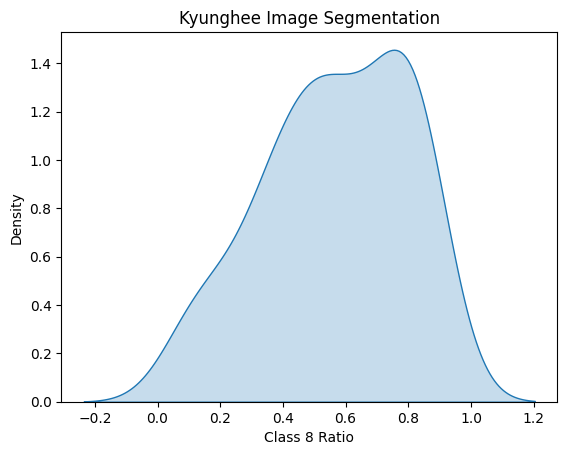

count    44.000000
mean      0.566472
std       0.228112
min       0.085816
25%       0.419004
50%       0.565170
75%       0.790014
max       0.882334
Name: Class_8_Ratio, dtype: float64


In [ ]:
# df_class_8_ratios 데이터 프레임을 CSV 파일로 저장
df_class_8_ratios.to_csv('class_8_ratios.csv', index=False)


#불러오
df_loaded = pd.read_csv('/content/class_8_ratios.csv')

import seaborn as sns
import matplotlib.pyplot as plt

# KDE 그래프 그리기
sns.kdeplot(df_loaded['Class_8_Ratio'], shade=True)
plt.title('Kyunghee Image Segmentation')
plt.xlabel('Class 8 Ratio')
plt.ylabel('Density')
plt.show()

# Class_8_Ratio 컬럼에 대한 기초 통계값 추출
basic_statistics = df_loaded['Class_8_Ratio'].describe()

print(basic_statistics)
